In [11]:
!pip install captum

     |████████████████████████████████| 1.4 MB 12.8 MB/s 


In [ ]:
torch.cuda.current_device()

0

In [ ]:
torch.cuda.device_count()

1

In [ ]:
torch.cuda.get_device_name(0)

'Tesla P100-PCIE-16GB'

In [12]:
import torch
import tensorflow as tf
import captum
import numpy as np
import torch.nn as nn
import torch.nn.functional as F
import torchvision
import time
import pandas as pd
import json
from IPython.display import clear_output
from torch.utils.tensorboard import SummaryWriter # TensorBoard support


In [13]:
if torch.cuda.is_available():  
  DEVICE = "cuda:0" 
else:  
  DEVICE = "cpu" 

In [14]:
print('PyTorch Version: ', torch.__version__)
DEVICE = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')

PyTorch Version:  1.10.0+cu111


##Ściągnięcie anych ze zbioru CIFAR10 

In [15]:
train_set = torchvision.datasets.CIFAR10(
    root = './data/CIFAR10/train',
    train = True,
    download = True,
    transform = torchvision.transforms.Compose([
        torchvision.transforms.ToTensor()                                 
    ])
)

# Use standard FashionMNIST dataset
test_set = torchvision.datasets.CIFAR10(
    root = './data/CIFAR10/test',
    train = False,
    download = True,
    transform = torchvision.transforms.Compose([
        torchvision.transforms.ToTensor()                                 
    ])
)

  0%|          | 0/170498071 [00:00<?, ?it/s]

Extracting ./data/CIFAR10/train/cifar-10-python.tar.gz to ./data/CIFAR10/train


  0%|          | 0/170498071 [00:00<?, ?it/s]

Extracting ./data/CIFAR10/test/cifar-10-python.tar.gz to ./data/CIFAR10/test


### Podzbiór danych CIFAR10 
Podzbiór składa się z 17000 obrazków, po 1700 z każdej klasy.

In [16]:
y_train1 = np.asarray(train_set.targets)
X_train1 = np.asarray(train_set.data)

np.random.seed(seed=123)
indices1=np.empty(0,dtype="int8")
for i in range(0,len(np.unique(y_train1))):
    indices1=np.append(indices1,np.random.choice(np.where((y_train1[0:len(y_train1)])==i)[0],1700,replace=False))
    indices1.sort()

y_train = y_train1[indices1]
X_train = X_train1[indices1]

train_subset = torch.utils.data.Subset(train_set, indices1)

In [ ]:
from collections  import OrderedDict
params = OrderedDict(
    lr = [.01,0.001],
    batch_size = [100,1000],
    shuffle = [True, False],
)
epochs = 3

##Model ResNet 
Porównanie wielkości 18 i 34

In [18]:
class BasicBlock(nn.Module):
    expansion = 1

    def __init__(self, in_planes, planes, stride=1):
        super(BasicBlock, self).__init__()
        self.conv1 = nn.Conv2d(
            in_planes, planes, kernel_size=3, stride=stride, padding=1, bias=False)
        self.bn1 = nn.BatchNorm2d(planes)
        self.conv2 = nn.Conv2d(planes, planes, kernel_size=3,
                               stride=1, padding=1, bias=False)
        self.bn2 = nn.BatchNorm2d(planes)

        self.shortcut = nn.Sequential()
        if stride != 1 or in_planes != self.expansion*planes:
            self.shortcut = nn.Sequential(
                nn.Conv2d(in_planes, self.expansion*planes,
                          kernel_size=1, stride=stride, bias=False),
                nn.BatchNorm2d(self.expansion*planes)
            )

    def forward(self, x):
        out = F.relu(self.bn1(self.conv1(x)))
        out = self.bn2(self.conv2(out))
        out += self.shortcut(x)
        out = F.relu(out)
        return out


In [19]:
class Bottleneck(nn.Module):
    expansion = 4

    def __init__(self, in_planes, planes, stride=1):
        super(Bottleneck, self).__init__()
        self.conv1 = nn.Conv2d(in_planes, planes, kernel_size=1, bias=False)
        self.bn1 = nn.BatchNorm2d(planes)
        self.conv2 = nn.Conv2d(planes, planes, kernel_size=3,
                               stride=stride, padding=1, bias=False)
        self.bn2 = nn.BatchNorm2d(planes)
        self.conv3 = nn.Conv2d(planes, self.expansion *
                               planes, kernel_size=1, bias=False)
        self.bn3 = nn.BatchNorm2d(self.expansion*planes)

        self.shortcut = nn.Sequential()
        if stride != 1 or in_planes != self.expansion*planes:
            self.shortcut = nn.Sequential(
                nn.Conv2d(in_planes, self.expansion*planes,
                          kernel_size=1, stride=stride, bias=False),
                nn.BatchNorm2d(self.expansion*planes)
            )

    def forward(self, x):
        out = F.relu(self.bn1(self.conv1(x)))
        out = F.relu(self.bn2(self.conv2(out)))
        out = self.bn3(self.conv3(out))
        out += self.shortcut(x)
        out = F.relu(out)
        return out



In [20]:
class ResNet(nn.Module):
    def __init__(self, block, num_blocks, num_classes=10):
        super(ResNet, self).__init__()
        self.in_planes = 64

        self.conv1 = nn.Conv2d(3, 64, kernel_size=3,
                               stride=1, padding=1, bias=False)
        self.bn1 = nn.BatchNorm2d(64)
        self.layer1 = self._make_layer(block, 64, num_blocks[0], stride=1)
        self.layer2 = self._make_layer(block, 128, num_blocks[1], stride=2)
        self.layer3 = self._make_layer(block, 256, num_blocks[2], stride=2)
        self.layer4 = self._make_layer(block, 512, num_blocks[3], stride=2)
        self.linear = nn.Linear(512*block.expansion, num_classes)

    def _make_layer(self, block, planes, num_blocks, stride):
        strides = [stride] + [1]*(num_blocks-1)
        layers = []
        for stride in strides:
            layers.append(block(self.in_planes, planes, stride))
            self.in_planes = planes * block.expansion
        return nn.Sequential(*layers)

    def forward(self, x):
        out = F.relu(self.bn1(self.conv1(x)))
        out = self.layer1(out)
        out = self.layer2(out)
        out = self.layer3(out)
        out = self.layer4(out)
        out = F.avg_pool2d(out, 4)
        out = out.view(out.size(0), -1)
        out = self.linear(out)
        return out


In [21]:
def ResNet18():
    return ResNet(BasicBlock, [2, 2, 2, 2])


In [22]:
def ResNet34():
    return ResNet(BasicBlock, [3, 4, 6, 3])

In [23]:
def Basic():
  return BasicBlock(3, 64)

In [24]:
def test():
    net = ResNet18()
    y = net(torch.randn(1, 3, 32, 32))
    print(y.size())

test()

torch.Size([1, 10])


In [25]:
# import modules to build RunBuilder and RunManager helper classes
from collections import namedtuple
from itertools import product

# Read in the hyper-parameters and return a Run namedtuple containing all the 
# combinations of hyper-parameters
class RunBuilder():
  @staticmethod
  def get_runs(params):

    Run = namedtuple('Run', params.keys())

    runs = []
    for v in product(*params.values()):
      runs.append(Run(*v))
    
    return runs

# Helper class, help track loss, accuracy, epoch time, run time, 
# hyper-parameters etc. Also record to TensorBoard and write into csv, json
class RunManager():
  def __init__(self):

    # tracking every epoch count, loss, accuracy, time
    self.epoch_count = 0
    self.epoch_loss = 0
    self.epoch_num_correct = 0
    self.epoch_start_time = None

    # tracking every run count, run data, hyper-params used, time
    self.run_params = None
    self.run_count = 0
    self.run_data = []
    self.run_start_time = None

    # record model, loader and TensorBoard 
    self.network = None
    self.loader = None
    self.loader_test = None
    self.tb = None

  # record the count, hyper-param, model, loader of each run
  # record sample images and network graph to TensorBoard  
  def begin_run(self, run, network, train_loader,test_loader):

    self.run_start_time = time.time()

    self.run_params = run
    self.run_count += 1

    self.network = network
    self.loader = train_loader
    self.test_loader = test_loader
    self.tb = SummaryWriter(comment=f'-{run}')

    images, labels = next(iter(self.loader))
    grid = torchvision.utils.make_grid(images.to(DEVICE))

    self.tb.add_image('images', grid)
    self.tb.add_graph(self.network, images.to(DEVICE))

  # when run ends, close TensorBoard, zero epoch count
  def end_run(self):
    self.tb.close()
    self.epoch_count = 0

  # zero epoch count, loss, accuracy, 
  def begin_epoch(self):
    self.epoch_start_time = time.time()

    self.epoch_count += 1
    self.epoch_loss = 0
    self.epoch_num_correct = 0

    self.epoch_loss_test = 0
    self.epoch_num_correct_test = 0

  # 
  def end_epoch(self):
    # calculate epoch duration and run duration(accumulate)
    epoch_duration = time.time() - self.epoch_start_time
    run_duration = time.time() - self.run_start_time

    # record epoch loss and accuracy
    loss = self.epoch_loss / len(self.loader.dataset)
    accuracy = self.epoch_num_correct / len(self.loader.dataset)

    accuracy_test = self.epoch_num_correct_test / len(self.test_loader.dataset)

    # Record epoch loss and accuracy to TensorBoard 
    self.tb.add_scalar('Loss', loss, self.epoch_count)
    self.tb.add_scalar('Accuracy', accuracy, self.epoch_count)
    self.tb.add_scalar('Accuracy_test', accuracy_test, self.epoch_count)


    # Record params to TensorBoard
    for name, param in self.network.named_parameters():
      self.tb.add_histogram(name, param, self.epoch_count)
      self.tb.add_histogram(f'{name}.grad', param.grad, self.epoch_count)
    
    # Write into 'results' (OrderedDict) for all run related data
    results = OrderedDict()
    results["run"] = self.run_count
    results["epoch"] = self.epoch_count
    results["loss"] = loss
    results["accuracy"] = accuracy
    results["accuracy_test"] = accuracy_test
    results["epoch duration"] = epoch_duration
    results["run duration"] = run_duration

    # Record hyper-params into 'results'
    for k,v in self.run_params._asdict().items(): results[k] = v
    self.run_data.append(results)
    df = pd.DataFrame.from_dict(self.run_data, orient = 'columns')

    # display epoch information and show progress
    clear_output(wait=True)
    display(df)

  # accumulate loss of batch into entire epoch loss
  def track_loss(self, loss):
    # multiply batch size so variety of batch sizes can be compared
    self.epoch_loss += loss.item() * self.loader.batch_size

  # accumulate number of corrects of batch into entire epoch num_correct
  def track_num_correct(self, preds, labels):
    self.epoch_num_correct += self._get_num_correct(preds, labels)

# accumulate number of corrects of batch in test set into entire epoch num_correct
  def track_num_correct_test(self, preds, labels):
    self.epoch_num_correct_test += self._get_num_correct(preds, labels)


  @torch.no_grad()
  def _get_num_correct(self, preds, labels):
    return preds.argmax(dim=1).eq(labels).sum().item()
  
  # save end results of all runs into csv, json for further analysis
  def save(self, fileName):

    pd.DataFrame.from_dict(
        self.run_data, 
        orient = 'columns',
    ).to_csv(f'{fileName}.csv')

    with open(f'{fileName}.json', 'w', encoding='utf-8') as f:
      json.dump(self.run_data, f, ensure_ascii=False, indent=4)

In [ ]:
def run_eval(params, model, output_name, train_set):
  m = RunManager()

  # get all runs from params using RunBuilder class
  for run in RunBuilder.get_runs(params):

      # if params changes, following line of code should reflect the changes too
      network = model().to(DEVICE)
      loader_test = torch.utils.data.DataLoader(test_set, batch_size = run.batch_size,num_workers=2)
      loader_train = torch.utils.data.DataLoader(train_set, batch_size = run.batch_size,num_workers=2)
   
      # loader = torch.utils.data.DataLoader(train_set, batch_size = run.batch_size)
      optimizer = torch.optim.Adam(network.parameters(), lr=run.lr)

      m.begin_run(run, network, loader_train, loader_test)
      for epoch in range(epochs):
        
        m.begin_epoch()

        for batch in loader_test:

          images = batch[0].to(DEVICE)
          labels = batch[1].to(DEVICE)
          preds = network(images)
          m.track_num_correct_test(preds, labels)

        for batch in loader_train:

          images = batch[0].to(DEVICE)
          labels = batch[1].to(DEVICE)
          preds = network(images)
          loss = F.cross_entropy(preds, labels)

          optimizer.zero_grad()
          loss.backward()
          optimizer.step()

          m.track_loss(loss)
          m.track_num_correct(preds, labels)

        m.end_epoch()
      m.end_run()

  # when all runs are done, save results to files
  m.save(output_name)

In [ ]:
# put all hyper params into a OrderedDict, easily expandable
from collections  import OrderedDict
params = OrderedDict(
    lr = [.01, .001],
    batch_size = [100, 1000],
    shuffle = [True, False]
)
epochs = 3

## Porównanie wartości parametrów

In [ ]:
run_eval(params = params, model=ResNet18, output_name = 'ResNet18', train_set = train_subset)

,run,epoch,loss,accuracy,accuracy_test,epoch duration,run duration,lr,batch_size,shuffle
0,1,1,2.045672,0.267647,0.0937,15.637128,16.550893,0.010,100,True
1,1,2,1.599325,0.405706,0.3691,15.598325,34.660565,0.010,100,True
2,1,3,1.412476,0.480294,0.4388,15.601825,52.662819,0.010,100,True
3,2,1,2.005813,0.273000,0.0991,15.623899,16.254703,0.010,100,False
4,2,2,1.589094,0.405824,0.3720,15.618985,34.379224,0.010,100,False
5,2,3,1.401872,0.483765,0.4524,15.628735,52.486217,0.010,100,False
6,3,1,2.904266,0.147294,0.1111,13.555359,15.903197,0.010,1000,True
7,3,2,2.072848,0.254647,0.2139,13.334691,31.662692,0.010,1000,True
8,3,3,1.896566,0.307529,0.2695,13.442915,47.779841,0.010,1000,True
9,4,1,2.625412,0.164706,0.0981,13.126309,15.816740,0.010,1000,False


Dla ok. 30% danych wyniki są lepsze w przypadku learning rate rownym 0.001,, niż dla 0.01.
Za wynik odpowiada również, czy kolejność prezentacji przykładów była zmieniana. Dla wartości True accuracy jest większa. 
W naszym przypadku mniejsza liczba próbek podawana jednocześnie sprawdziła się lepiej. Dane wnioski sprawdzają się również na zbiorze testowym.

## Porównanie ResNet18 i ResNet34

In [ ]:
params = OrderedDict(
    lr = [0.001],
    batch_size = [100],
    shuffle = [True],
)
epochs = 3

In [ ]:
torch.cuda.memory_summary(device=None, abbreviated=False)


'|===========================================================================|\n|                  PyTorch CUDA memory summary, device ID 0                 |\n|---------------------------------------------------------------------------|\n|            CUDA OOMs: 0            |        cudaMalloc retries: 2         |\n|===========================================================================|\n|        Metric         | Cur Usage  | Peak Usage | Tot Alloc  | Tot Freed  |\n|---------------------------------------------------------------------------|\n| Allocated memory      |  180498 KB |   10263 MB |   32120 GB |   32120 GB |\n|       from large pool |  167072 KB |   10237 MB |   32093 GB |   32093 GB |\n|       from small pool |   13426 KB |      29 MB |      27 GB |      27 GB |\n|---------------------------------------------------------------------------|\n| Active memory         |  180498 KB |   10263 MB |   32120 GB |   32120 GB |\n|       from large pool |  167072 KB |   10237 MB |

In [ ]:
run_eval(params = params, model=ResNet34, output_name = 'ResNet34', train_set = train_subset)

,run,epoch,loss,accuracy,accuracy_test,epoch duration,run duration,lr,batch_size,shuffle
0,1,1,1.736743,0.360882,0.1226,25.188703,26.120943,0.001,100,True
1,1,2,1.324318,0.512529,0.4734,25.127670,55.913783,0.001,100,True
2,1,3,1.108715,0.602235,0.5670,25.133885,85.620228,0.001,100,True


In [ ]:
run_eval(params = params, model=ResNet18, output_name = 'ResNet18_2', train_set = train_subset)

,run,epoch,loss,accuracy,accuracy_test,epoch duration,run duration,lr,batch_size,shuffle
0,1,1,1.673155,0.381824,0.1067,15.584140,16.213835,0.001,100,True
1,1,2,1.274928,0.537353,0.4907,15.538559,34.176109,0.001,100,True
2,1,3,1.028711,0.631235,0.5978,15.575015,52.264771,0.001,100,True


Lepszą wartośc accuracy ma ResNet18 niż ResNet34. Dla zbioru treningowego ResNet18 ma wartośc accuracy równą 0.63, a ResNet34 przy tych samych parametrach (epoch = 3, learning_rate = 0.001, batch_size = 100) i na tym samym zbiorze ma wartość 0.55. Podobne zależności możemy zobaczyć na zbiorze testowym.

In [30]:
def append_dropout(model, rate=0.2):
        for name, module in model.named_children():
            if len(list(module.children())) > 0:
                append_dropout(module)
            if isinstance(module, nn.ReLU):
                new = nn.Sequential(module, nn.Dropout2d(p=rate, inplace=True))
                setattr(model, name, new)



In [31]:
def ResNet18_dropout():
    model = ResNet18()
    append_dropout(model)
    return model


Po zastosowaniu dropoutu accuracy polepiszyło się z 63% do 65%.

In [ ]:
params = OrderedDict(
    lr = [0.001],
    batch_size = [100],
    shuffle = [True],
)
epochs = 10

In [ ]:
resnet18_dropout = run_eval(params=params, model=ResNet18_dropout, output_name='resNet18_dropout', train_set = train_subset)

,run,epoch,loss,accuracy,accuracy_test,epoch duration,run duration,lr,batch_size,shuffle
0,1,1,1.620983,0.401412,0.0963,15.588122,16.230090,0.001,100,True
1,1,2,1.237360,0.547176,0.4962,15.583659,34.292936,0.001,100,True
2,1,3,1.017643,0.633471,0.6044,15.540013,52.227525,0.001,100,True
3,1,4,0.848457,0.694118,0.6597,15.569975,70.318870,0.001,100,True
4,1,5,0.693714,0.753294,0.6896,15.555202,88.404110,0.001,100,True
5,1,6,0.571659,0.796882,0.7059,15.564728,106.416983,0.001,100,True
6,1,7,0.460593,0.839118,0.7087,15.589281,124.482417,0.001,100,True
7,1,8,0.361859,0.871647,0.7046,15.552684,142.422497,0.001,100,True
8,1,9,0.276412,0.902588,0.6986,15.560720,160.345699,0.001,100,True
9,1,10,0.186093,0.935353,0.7042,15.558024,178.353455,0.001,100,True


In [32]:
network = ResNet18_dropout()
PATH = './cifar_net.pth'
torch.save(network.state_dict(), PATH)

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
# to export model
!cp -av './runs/' '/content/gdrive/My Drive/temp-runs'


'./runs/Mar30_16-58-55_291788632e73-Run(lr=0.01, batch_size=100, shuffle=True)/events.out.tfevents.1648659535.291788632e73.86.0' -> '/content/gdrive/My Drive/temp-runs/runs/Mar30_16-58-55_291788632e73-Run(lr=0.01, batch_size=100, shuffle=True)/events.out.tfevents.1648659535.291788632e73.86.0'
'./runs/Mar30_16-59-50_291788632e73-Run(lr=0.01, batch_size=100, shuffle=False)/events.out.tfevents.1648659590.291788632e73.86.1' -> '/content/gdrive/My Drive/temp-runs/runs/Mar30_16-59-50_291788632e73-Run(lr=0.01, batch_size=100, shuffle=False)/events.out.tfevents.1648659590.291788632e73.86.1'
'./runs/Mar30_17-00-45_291788632e73-Run(lr=0.01, batch_size=1000, shuffle=True)/events.out.tfevents.1648659645.291788632e73.86.2' -> '/content/gdrive/My Drive/temp-runs/runs/Mar30_17-00-45_291788632e73-Run(lr=0.01, batch_size=1000, shuffle=True)/events.out.tfevents.1648659645.291788632e73.86.2'
'./runs/Mar30_17-01-35_291788632e73-Run(lr=0.01, batch_size=1000, shuffle=False)/events.out.tfevents.1648659695.29

In [ ]:
# Load the TensorBoard notebook extension
%load_ext tensorboard

In [ ]:
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

## Macierz Konfuzji

In [67]:
network = ResNet18()

In [73]:
train_loader = torch.utils.data.DataLoader(train_subset, batch_size = 4, shuffle=True)
test_loader = torch.utils.data.DataLoader(test_set, batch_size=4, shuffle=False)

torch.Size([4, 3, 32, 32])
torch.Size([4])
labels: tensor([8, 9, 2, 0])


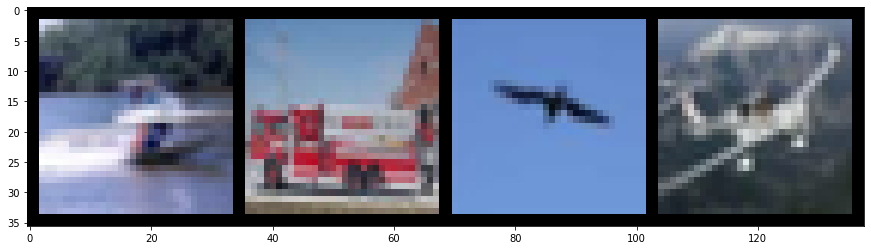

In [74]:
batch = next(iter(train_loader))

images, labels = batch

print(images.shape)
print(labels.shape)
grid = torchvision.utils.make_grid(images, nrow=10)

plt.figure(figsize=(15,15))
plt.imshow(grid.permute(1,2,0))

print('labels:', labels)

In [76]:
torch.cuda.empty_cache()

In [77]:
@torch.no_grad()
def get_all_preds(model, loader):
  all_preds = torch.tensor([])
  for batch in loader:
    images, labels = batch

    preds = model(images)
    all_preds = torch.cat((all_preds, preds) ,dim=0)

  return all_preds
test_loader = torch.utils.data.DataLoader(test_set, batch_size = 1000,num_workers=2)
test_preds = get_all_preds(network, test_loader)
actual_labels = torch.Tensor(test_set.targets)
preds_correct = test_preds.argmax(dim=1).eq(actual_labels).sum().item()

print('total correct:', preds_correct)
print('accuracy:', preds_correct / len(test_set))

total correct: 6988
accuracy: 0.6988


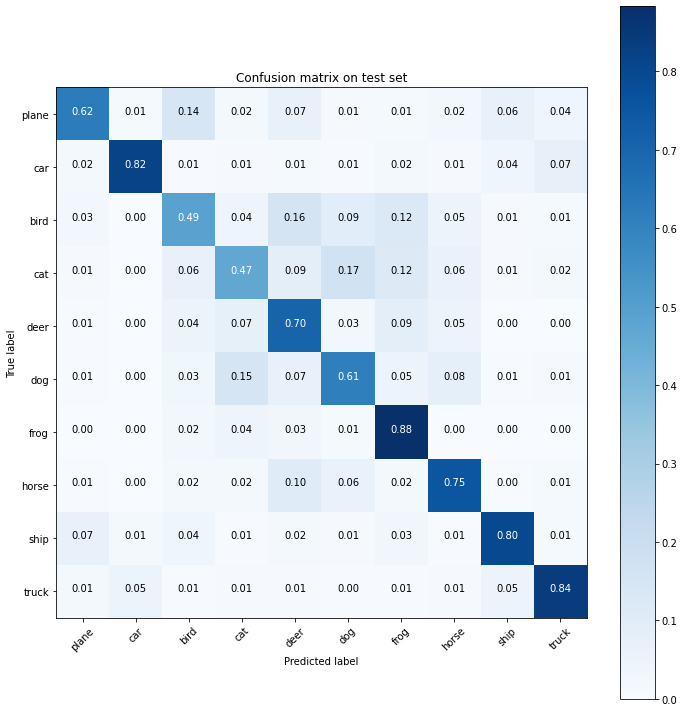

In [78]:
import itertools
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix

def plot_confusion_matrix(cm, classes,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

cm = confusion_matrix(test_set.targets, test_preds.argmax(dim=1))
classes = train_set.classes
plt.figure(figsize=(10,10))
plot_confusion_matrix(cm, classes,title='Confusion matrix on test set')

Z macierzy konfuzji możemy zobaczyć co jest najczęsciej mylone. Widzimy np, że występują częste pomyłki w rozróżnieniu kota i psa.

truck został pomylony z cat


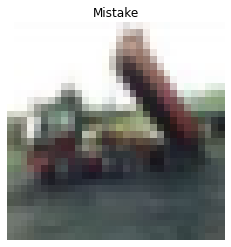

deer został pomylony z ship


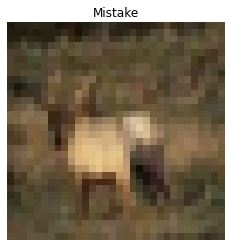

bird został pomylony z airplane


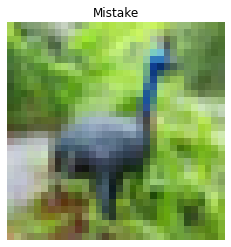

deer został pomylony z airplane


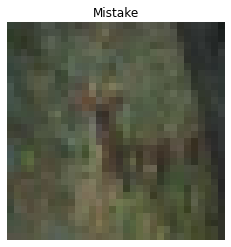

horse został pomylony z frog


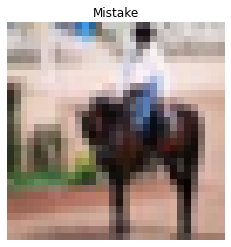

truck został pomylony z frog


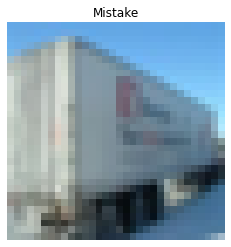

truck został pomylony z automobile


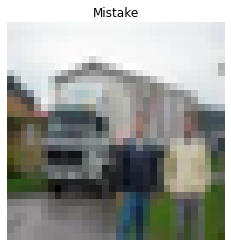

cat został pomylony z frog


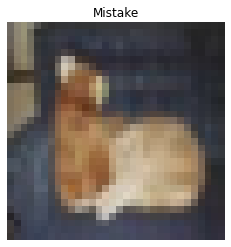

bird został pomylony z cat


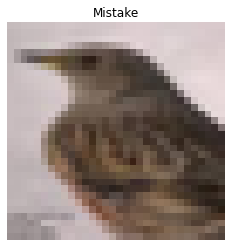

frog został pomylony z automobile


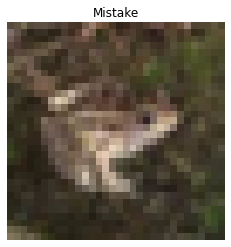

cat został pomylony z deer


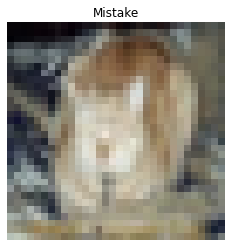

In [92]:
k = 0
for i in range(len(train_subset)):
  if y_train[i] != np.asarray(test_preds.argmax(dim=1))[i] :
    print(f'{train_set.classes[y_train[i]]} został pomylony z {train_set.classes[np.asarray(test_preds.argmax(dim=1))[i]]}')  
    img, label = train_subset[i]
    plt.title('Mistake')
    plt.axis("off")
    plt.imshow(img.cpu().permute(1, 2, 0))
    plt.show()
    k += 1
  if k > 10:
    break

In [80]:
@torch.no_grad()
def get_all_preds(model, loader):
  all_preds = torch.tensor([])
  for batch in loader:
    images, labels = batch

    preds = model(images)
    all_preds = torch.cat((all_preds, preds) ,dim=0)

  return all_preds
test_loader_small = torch.utils.data.DataLoader(test_set, batch_size = 100,num_workers=2)
test_preds = get_all_preds(network, test_loader_small)

In [81]:
import os

weights_path = 'v5-weights.81-0.3749.hdf5'
out_dir = 'v5-features'

if not os.path.exists(out_dir):
    os.makedirs(out_dir)

In [82]:
from sklearn.decomposition import PCA

pca = PCA(n_components=2)
pca.fit(test_preds)
pca_features = pca.transform(test_preds)

np.save(os.path.join(out_dir, 'fc1_features_pca_2dim.npy'), pca_features)

In [83]:
tx, ty = pca_features[:,0], pca_features[:,1]
tx = (tx-np.min(tx)) / (np.max(tx) - np.min(tx))
ty = (ty-np.min(ty)) / (np.max(ty) - np.min(ty))

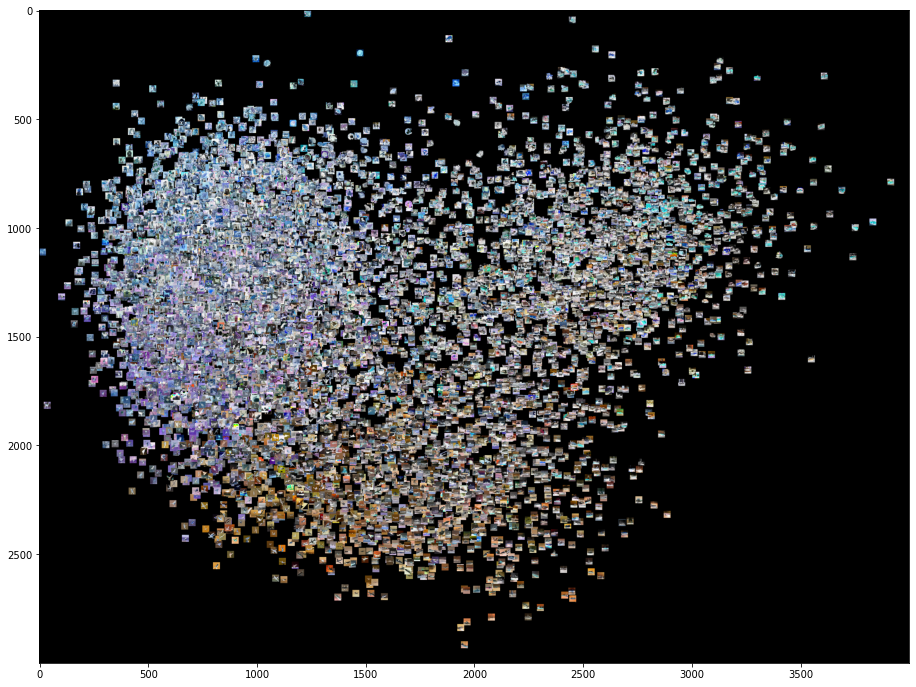

In [84]:
import matplotlib.pyplot as plt
from PIL import Image

width = 4000
height = 3000
max_dim = 100

full_image = Image.new('RGB', (width, height))
for idx, x in enumerate(test_set.data):
    tile = Image.fromarray(np.uint8(x * 255))
    #tile = Image.open(img)
    rs = max(1, tile.width/max_dim, tile.height/max_dim)
    tile = tile.resize((int(tile.width/rs), int(tile.height/rs)), Image.ANTIALIAS)
    full_image.paste(tile, (int((width-max_dim) * tx[idx]), int((height-max_dim) * ty[idx])))

%matplotlib inline
plt.figure(figsize = (16,12))
plt.imshow(full_image)

In [85]:
full_image.save(os.path.join(out_dir, "fc1_pca.jpg"))


In [86]:
from sklearn.manifold import TSNE

tsne = TSNE().fit_transform(pca_features)
np.save(os.path.join(out_dir, 'fc1_features_tsne_default.npy'), tsne)

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


In [87]:
tx, ty = tsne[:,0], tsne[:,1]
tx = (tx-np.min(tx)) / (np.max(tx) - np.min(tx))
ty = (ty-np.min(ty)) / (np.max(ty) - np.min(ty))

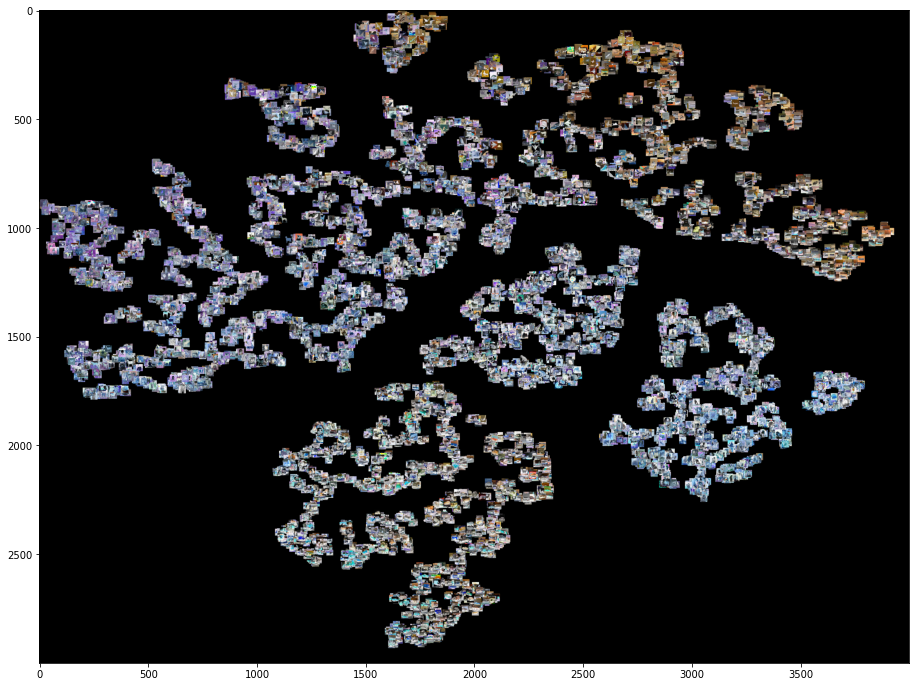

In [88]:
import matplotlib.pyplot as plt
from PIL import Image

width = 4000
height = 3000
max_dim = 100

full_image = Image.new('RGB', (width, height))
for idx, x in enumerate(test_set.data):
    tile = Image.fromarray(np.uint8(x * 255))
    #tile = Image.open(img)
    rs = max(1, tile.width / max_dim, tile.height / max_dim)
    tile = tile.resize((int(tile.width / rs),
                        int(tile.height / rs)),
                       Image.ANTIALIAS)
    full_image.paste(tile, (int((width-max_dim) * tx[idx]),
                            int((height-max_dim) * ty[idx])))

%matplotlib inline
plt.figure(figsize = (16,12))
plt.imshow(full_image)

In [89]:
full_image.save(os.path.join(out_dir, "fc1_features_tsne_default.jpg"))


In [90]:
from keras.datasets import cifar10

# have to re-load cifar to get y_test back in its original form
_, (x_test, y_test) = cifar10.load_data()

y_test = np.asarray(y_test)

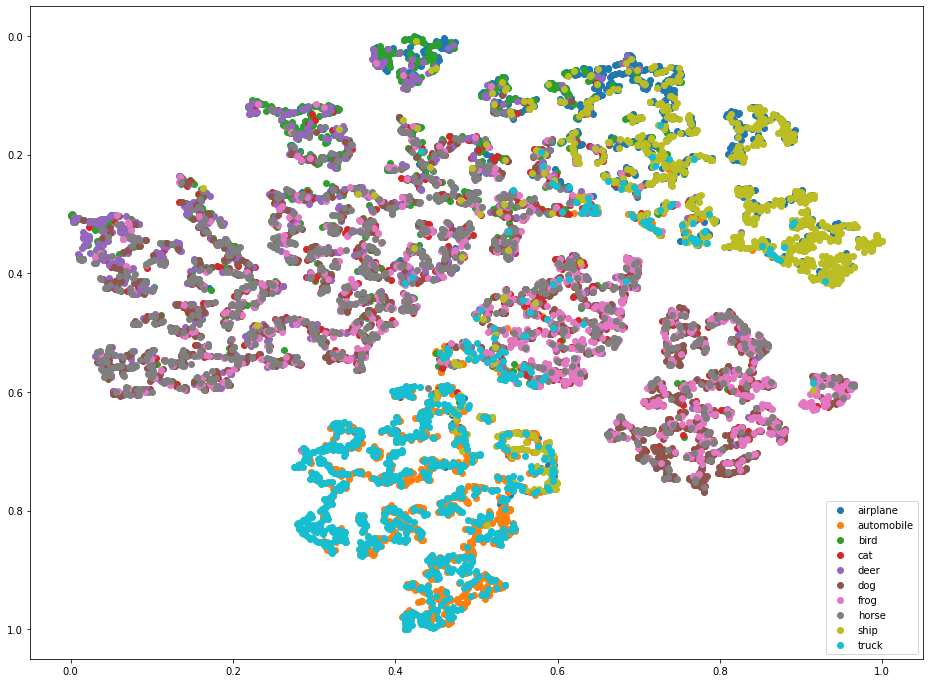

In [91]:
plt.figure(figsize = (16,12))

classes = ['airplane', 'automobile', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']
for i in range(len(classes)):
    y_i = y_test == i
    plt.scatter(tx[y_i[:, 0]], ty[y_i[:, 0]], label=classes[i])
plt.legend(loc=4)
plt.gca().invert_yaxis()
plt.savefig(os.path.join(out_dir, "fc1_features_tsne_default_pts.jpg"), bbox_inches='tight')
plt.show()